                                               Iris Flower Classification

Data Overview 

Shape: (1200, 21)

Columns: ['species', 'elevation', 'soil_type', 'sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'sepal_area', 'petal_area', 'sepal_aspect_ratio', 'petal_aspect_ratio', 'sepal_to_petal_length_ratio', 'sepal_to_petal_width_ratio', 'sepal_petal_length_diff', 'sepal_petal_width_diff', 'petal_curvature_mm', 'petal_texture_trichomes_per_mm2', 'leaf_area_cm2', 'sepal_area_sqrt', 'petal_area_sqrt', 'area_ratios']

Data types: All columns are either float64 or object (species, soil_type)

Missing values: None in any column

Species distribution: setosa (400), versicolor (400), virginica (400)

Statistical summary: All features have reasonable ranges and distributions​



In [3]:
# Import necessary libraries
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Load the data
df = pd.read_csv("iris_extended.csv")

# Data Overview
print("Shape:", df.shape)  # Check rows and columns
print("Columns:", df.columns.tolist())  # Feature names
print("Species distribution:\n", df["species"].value_counts())  # Target distribution


Shape: (1200, 21)
Columns: ['species', 'elevation', 'soil_type', 'sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'sepal_area', 'petal_area', 'sepal_aspect_ratio', 'petal_aspect_ratio', 'sepal_to_petal_length_ratio', 'sepal_to_petal_width_ratio', 'sepal_petal_length_diff', 'sepal_petal_width_diff', 'petal_curvature_mm', 'petal_texture_trichomes_per_mm2', 'leaf_area_cm2', 'sepal_area_sqrt', 'petal_area_sqrt', 'area_ratios']
Species distribution:
 species
setosa        400
versicolor    400
virginica     400
Name: count, dtype: int64


In [4]:
# Check for Missing Values
missing_values = df.isnull().sum()
print("Missing values per column:\n", missing_values)


Missing values per column:
 species                            0
elevation                          0
soil_type                          0
sepal_length                       0
sepal_width                        0
petal_length                       0
petal_width                        0
sepal_area                         0
petal_area                         0
sepal_aspect_ratio                 0
petal_aspect_ratio                 0
sepal_to_petal_length_ratio        0
sepal_to_petal_width_ratio         0
sepal_petal_length_diff            0
sepal_petal_width_diff             0
petal_curvature_mm                 0
petal_texture_trichomes_per_mm2    0
leaf_area_cm2                      0
sepal_area_sqrt                    0
petal_area_sqrt                    0
area_ratios                        0
dtype: int64


In [5]:
# Encode Categorical Columns
categorical_cols = df.select_dtypes(include='object').columns
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

print("Sample after encoding:\n", df.head())


Sample after encoding:
    species  elevation  soil_type  sepal_length  sepal_width  petal_length  \
0        0      161.8          2          5.16         3.41          1.64   
1        0      291.4          0          5.48         4.05          1.53   
2        0      144.3          2          5.10         2.80          1.47   
3        0      114.6          0          4.64         3.44          1.53   
4        0      110.9          1          4.85         2.87          1.23   

   petal_width  sepal_area  petal_area  sepal_aspect_ratio  ...  \
0         0.26     17.5956      0.4264            1.513196  ...   
1         0.37     22.1940      0.5661            1.353086  ...   
2         0.38     14.2800      0.5586            1.821429  ...   
3         0.17     15.9616      0.2601            1.348837  ...   
4         0.26     13.9195      0.3198            1.689895  ...   

   sepal_to_petal_length_ratio  sepal_to_petal_width_ratio  \
0                     3.146341                  

In [6]:
# Scale Numerical Columns
scaler = StandardScaler()
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns.drop("species", errors='ignore')
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

print("Scaled data sample:\n", df[numerical_cols].head())


Scaled data sample:
    elevation  soil_type  sepal_length  sepal_width  petal_length  petal_width  \
0  -0.162139   1.325851     -0.870654     0.677816     -1.228486    -1.275829   
1   1.627148  -1.138938     -0.492057     1.892466     -1.290818    -1.124850   
2  -0.403748   1.325851     -0.941641    -0.479897     -1.324818    -1.111125   
3  -0.813793  -1.138938     -1.485873     0.734753     -1.290818    -1.399357   
4  -0.864876   0.093457     -1.237419    -0.347045     -1.460816    -1.275829   

   sepal_area  petal_area  sepal_aspect_ratio  petal_aspect_ratio  \
0   -0.081240   -1.148201           -0.967199            1.106849   
1    1.276195   -1.117722           -1.282814            0.057205   
2   -1.059997   -1.119358           -0.359602           -0.071654   
3   -0.563593   -1.184484           -1.291190            2.407603   
4   -1.166415   -1.171459           -0.618884            0.344978   

   sepal_to_petal_length_ratio  sepal_to_petal_width_ratio  \
0              

Exploratary Data Analysis

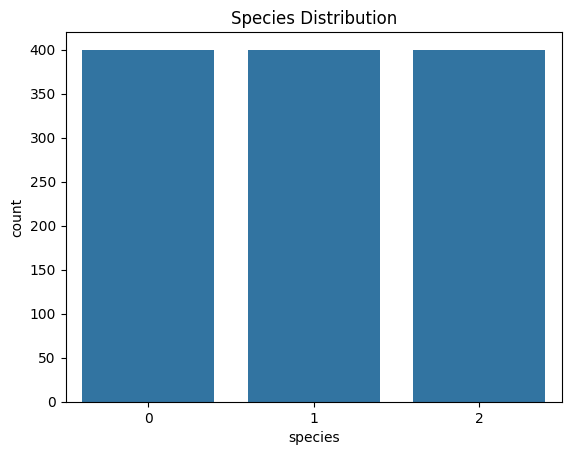

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

# Species count
sns.countplot(x='species', data=iris_df)
plt.title('Species Distribution')
plt.show()

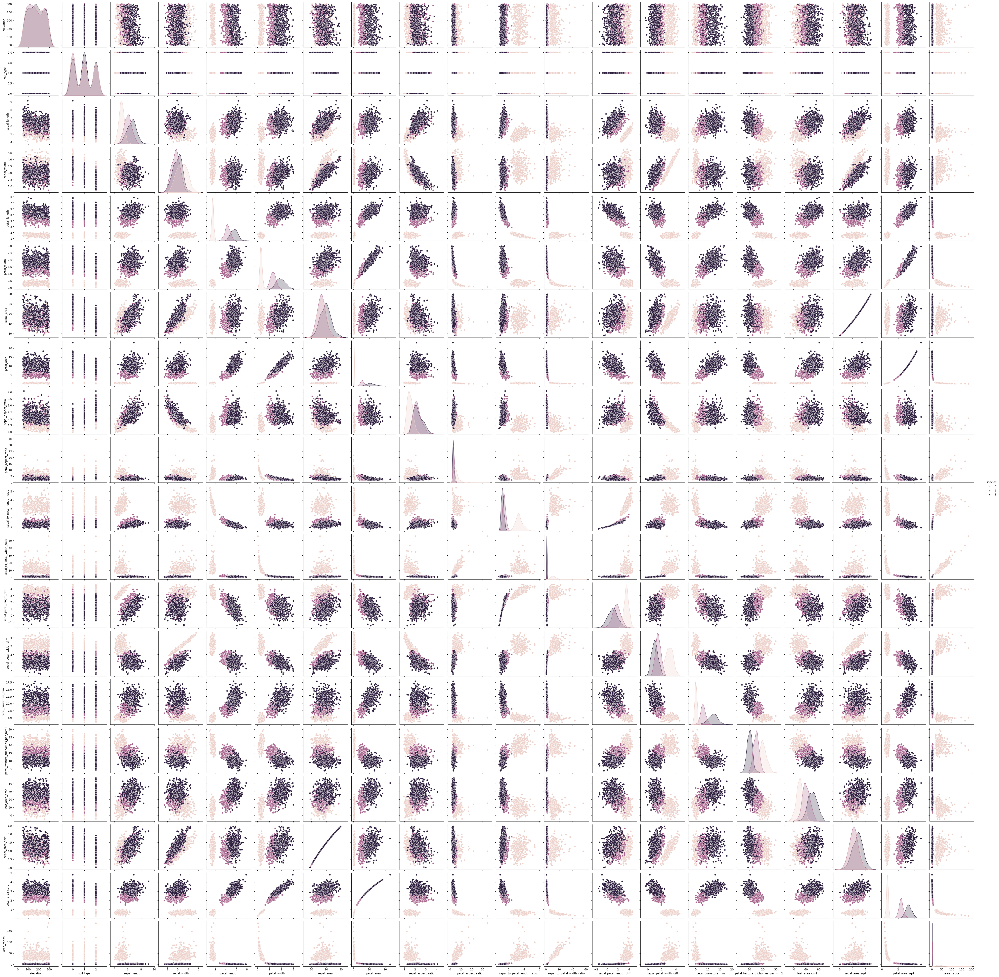

In [8]:
# Pairplot for numerical features
sns.pairplot(iris_df, hue='species')
plt.show()

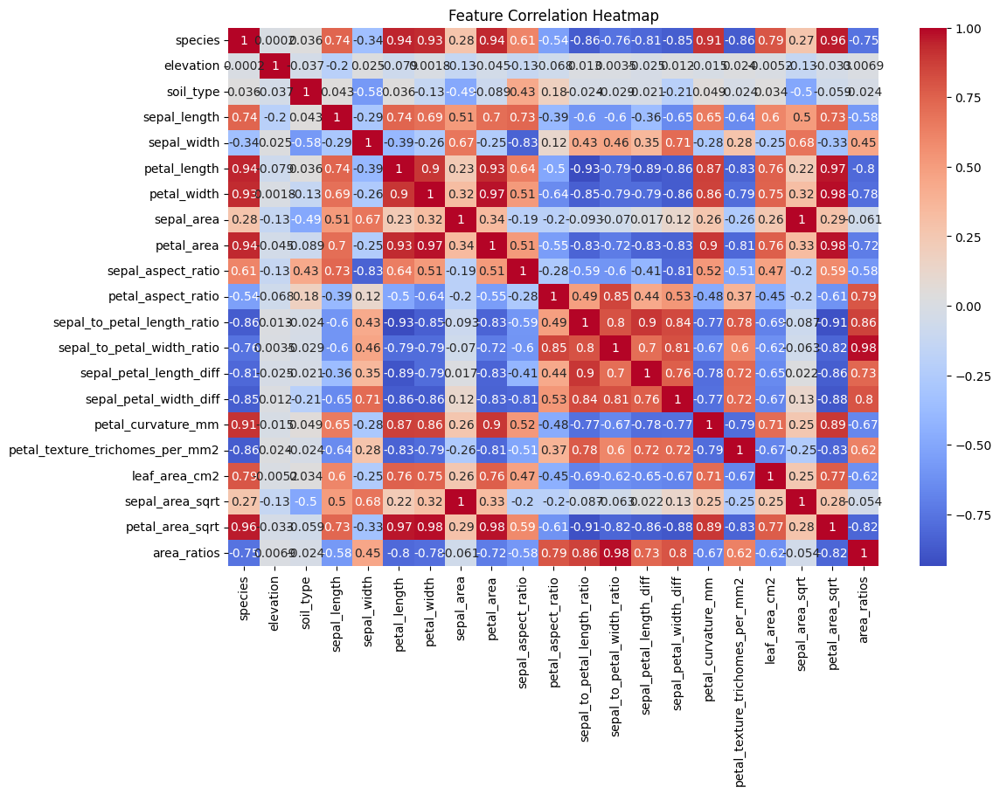

In [9]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(iris_df.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title('Feature Correlation Heatmap')
plt.show()

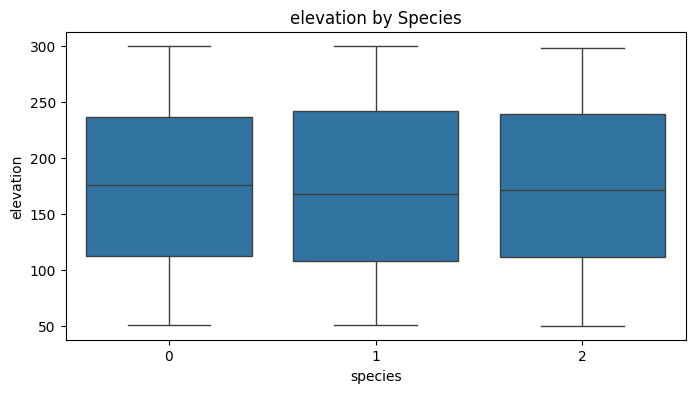

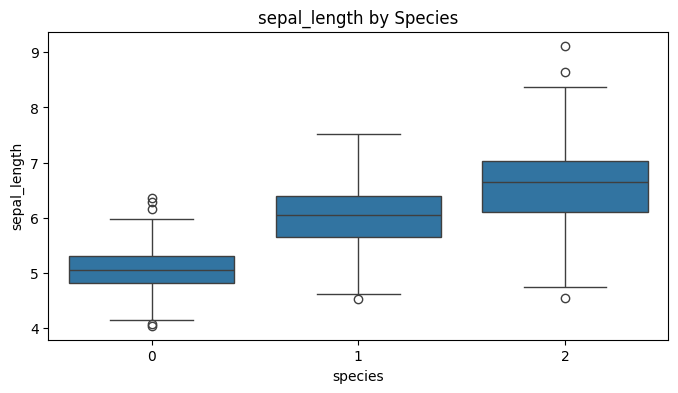

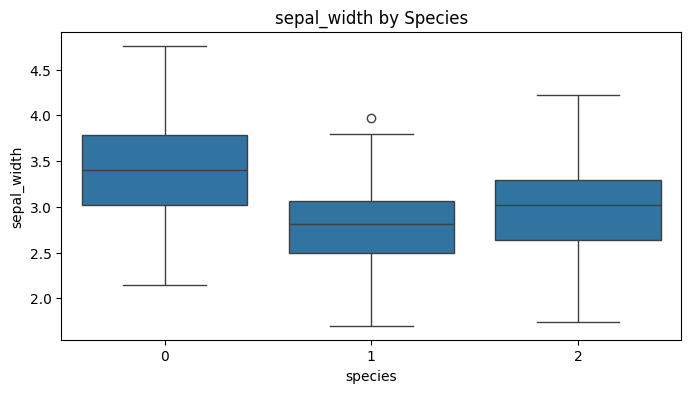

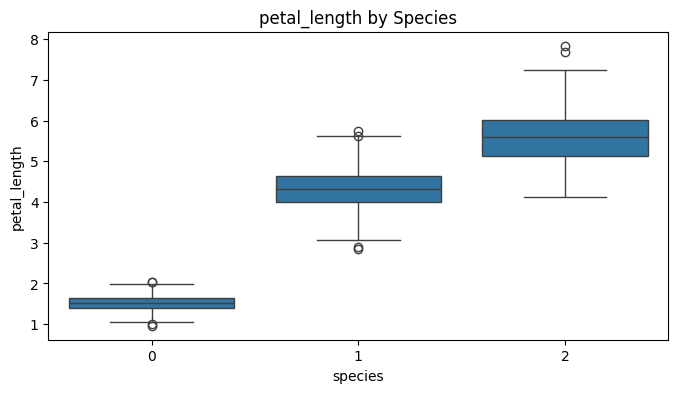

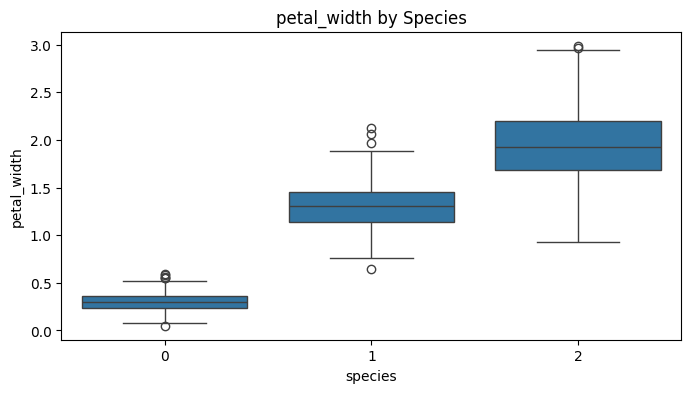

...

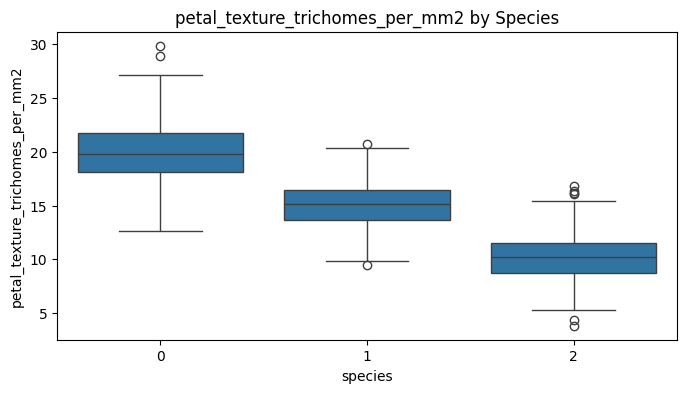

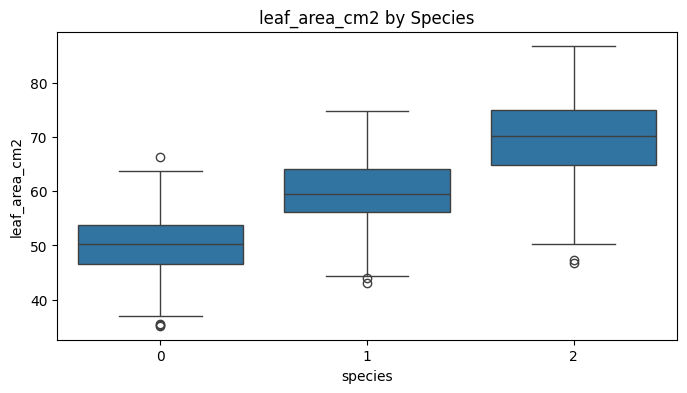

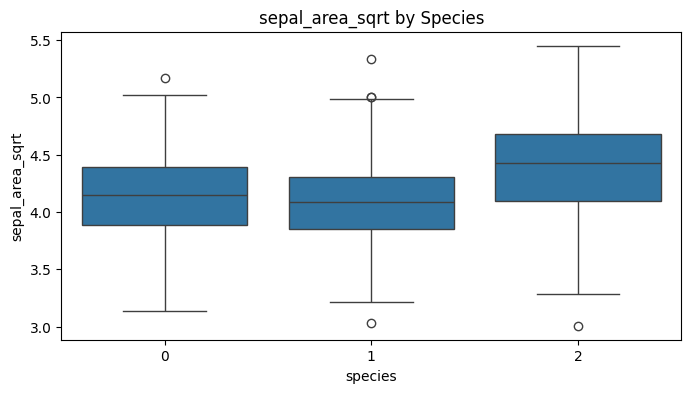

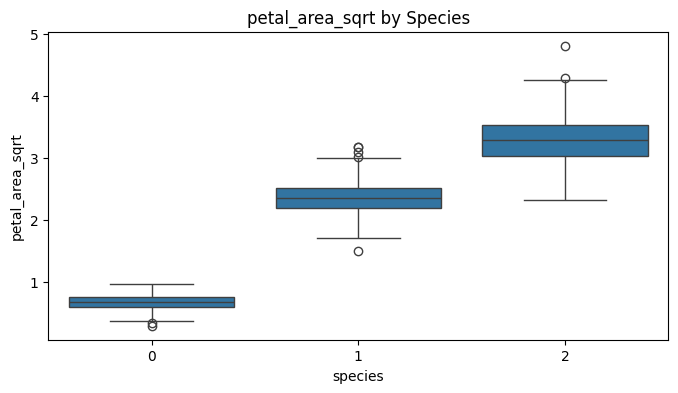

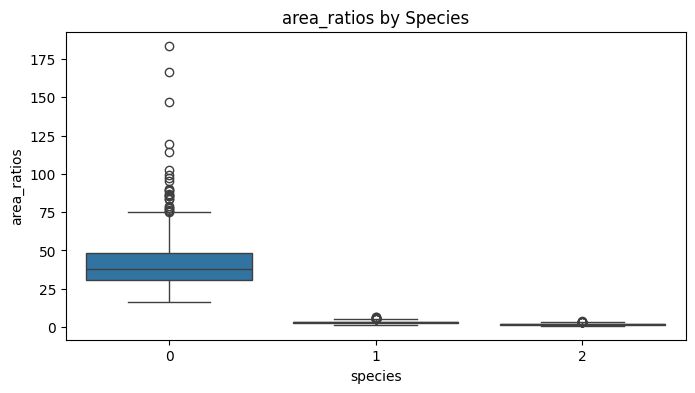

In [10]:
# Boxplots for numerical features by species
for col in iris_df.select_dtypes(include=['float64']).columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(x='species', y=col, data=iris_df)
    plt.title(f'{col} by Species')
    plt.show()

EDA Conclusion

The dataset is balanced across all three species.

Petal length and petal width are highly discriminative for species classification.

Features like sepal length and sepal width show some overlap but still provide useful information.

Strong correlations exist between petal features and some derived features.

No significant outliers or missing values were found.​

Feature Engineering

In [12]:
# Create new features (ratios, interactions)
iris_df['petal_sepal_ratio'] = iris_df['petal_length'] / iris_df['sepal_length']
iris_df['petal_sepal_area_ratio'] = iris_df['petal_area'] / iris_df['sepal_area']

# Select new features for modeling
X = iris_df.drop('species', axis=1)
y = iris_df['species']

In [14]:
# Load the dataset
df = pd.read_csv("iris_extended.csv")
df.head()

,species,elevation,soil_type,sepal_length,sepal_width,petal_length,petal_width,sepal_area,petal_area,sepal_aspect_ratio,...,sepal_to_petal_length_ratio,sepal_to_petal_width_ratio,sepal_petal_length_diff,sepal_petal_width_diff,petal_curvature_mm,petal_texture_trichomes_per_mm2,leaf_area_cm2,sepal_area_sqrt,petal_area_sqrt,area_ratios
0,setosa,161.8,sandy,5.16,3.41,1.64,0.26,17.5956,0.4264,1.513196,...,3.146341,13.115385,3.52,3.15,5.33,18.33,53.21,4.194711,0.652993,41.265478
1,setosa,291.4,clay,5.48,4.05,1.53,0.37,22.1940,0.5661,1.353086,...,3.581699,10.945946,3.95,3.68,5.90,20.45,52.53,4.711051,0.752396,39.205087
2,setosa,144.3,sandy,5.10,2.80,1.47,0.38,14.2800,0.5586,1.821429,...,3.469388,7.368421,3.63,2.42,5.66,24.62,50.25,3.778889,0.747395,25.563910
3,setosa,114.6,clay,4.64,3.44,1.53,0.17,15.9616,0.2601,1.348837,...,3.032680,20.235294,3.11,3.27,4.51,22.91,50.85,3.995197,0.510000,61.367166
4,setosa,110.9,loamy,4.85,2.87,1.23,0.26,13.9195,0.3198,1.689895,...,3.943089,11.038462,3.62,2.61,4.03,21.56,40.57,3.730885,0.565509,43.525641


In [16]:
# List columns — engineered features often include ratios and differences
print("Columns:\n", df.columns.tolist())

Columns:
 ['species', 'elevation', 'soil_type', 'sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'sepal_area', 'petal_area', 'sepal_aspect_ratio', 'petal_aspect_ratio', 'sepal_to_petal_length_ratio', 'sepal_to_petal_width_ratio', 'sepal_petal_length_diff', 'sepal_petal_width_diff', 'petal_curvature_mm', 'petal_texture_trichomes_per_mm2', 'leaf_area_cm2', 'sepal_area_sqrt', 'petal_area_sqrt', 'area_ratios']


In [17]:
# Identify engineered features for inspection
engineered_cols = [col for col in df.columns if (
    'ratio' in col.lower() 
    or 'diff' in col.lower()
    or 'aspect' in col.lower() 
    or 'curvature' in col.lower()
    or 'sqrt' in col.lower()
)]

print("Engineered feature columns:\n", engineered_cols)

Engineered feature columns:
 ['sepal_aspect_ratio', 'petal_aspect_ratio', 'sepal_to_petal_length_ratio', 'sepal_to_petal_width_ratio', 'sepal_petal_length_diff', 'sepal_petal_width_diff', 'petal_curvature_mm', 'sepal_area_sqrt', 'petal_area_sqrt', 'area_ratios']


In [18]:
# Show sample engineered feature values
print("Sample engineered features:\n", df[engineered_cols].head())

Sample engineered features:
    sepal_aspect_ratio  petal_aspect_ratio  sepal_to_petal_length_ratio  \
0            1.513196            6.307692                     3.146341   
1            1.353086            4.135135                     3.581699   
2            1.821429            3.868421                     3.469388   
3            1.348837            9.000000                     3.032680   
4            1.689895            4.730769                     3.943089   

   sepal_to_petal_width_ratio  sepal_petal_length_diff  \
0                   13.115385                     3.52   
1                   10.945946                     3.95   
2                    7.368421                     3.63   
3                   20.235294                     3.11   
4                   11.038462                     3.62   

   sepal_petal_width_diff  petal_curvature_mm  sepal_area_sqrt  \
0                    3.15                5.33         4.194711   
1                    3.68                5.90

Feature Selection

In [19]:
from sklearn.feature_selection import SelectKBest, f_classif

# Select top 10 features
selector = SelectKBest(score_func=f_classif, k=10)
X_selected = selector.fit_transform(X, y)
selected_features = X.columns[selector.get_support()]
print("Selected features:", selected_features)

Selected features: Index(['petal_length', 'petal_width', 'petal_area',
       'sepal_to_petal_length_ratio', 'sepal_petal_width_diff',
       'petal_curvature_mm', 'petal_texture_trichomes_per_mm2',
       'petal_area_sqrt', 'petal_sepal_ratio', 'petal_sepal_area_ratio'],
      dtype='object')


Model Fitting 

In [20]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

models = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(random_state=42),
    'SVM': SVC(random_state=42)
}

In [21]:
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"{name} Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(classification_report(y_test, y_pred))

Random Forest Accuracy: 0.9875
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        80
           1       0.98      0.99      0.98        80
           2       0.99      0.97      0.98        80

    accuracy                           0.99       240
   macro avg       0.99      0.99      0.99       240
weighted avg       0.99      0.99      0.99       240

Logistic Regression Accuracy: 0.9958
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        80
           1       0.99      1.00      0.99        80
           2       1.00      0.99      0.99        80

    accuracy                           1.00       240
   macro avg       1.00      1.00      1.00       240
weighted avg       1.00      1.00      1.00       240

SVM Accuracy: 0.9958
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        80
           1       0.99      1.00      0

In [22]:
best_model = models["Logistic Regression"]
best_model_name = "Logistic Regression"
print("Selected Best Model:", best_model_name)

Selected Best Model: Logistic Regression


In [25]:
import joblib
# Save the selected model (after fitting)
joblib.dump(best_model, "best_model.joblib")

['best_model.joblib']